## Radix Sort - MPI Strong Scaling and Speedup

In [1]:
# Jonathan Kutsch
import sys
sys.path.append("/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages")
sys.path.append("/scratch/group/csce435-f23/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd
import math

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [2]:
# dataframes
tk = th.Thicket.from_caliperreader(glob("/scratch/user/jonathankutsch/radix/radix/build/*.cali"))
tk.dataframe = tk.dataframe.drop(["spot.channel"], axis=1)
tk.dataframe = tk.dataframe.drop(["Min time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["Max time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["Total time"],axis=1)
tk.dataframe = tk.dataframe.drop(["Variance time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["nid"],axis=1)

In [3]:
# Performance data
tk.dataframe

Avg time/rank  \
node                                               profile                     
{'name': 'main', 'type': 'function'}               15253080         2.061253   
                                                   20885860         6.744469   
                                                   148334837        5.616242   
                                                   157593170        6.883443   
                                                   180596001       21.393093   
                                                   187456116        4.110961   
                                                   222083088        0.535033   
                                                   225194923        9.536905   
                                                   228205184        2.060109   
                                                   254092752        0.468859   
                                                   264061812        3.651471   
                                                   298537899        0.561624   
                                                   334108191      125.146091   
                                                   348959619        6.269150   
                                                   394559370        1.166450   
                                                   427559273        1.615365   
                                                   439549323        6.733968   
                                                   507155105        1.761586   
                                                   594481608       10.199006   
                                                   597785548       55.290379   
                                                   611159881        6.870633   
                                                   619610176        3.926248   
                                                   633341042      122.679504   
                                                   633719008        1.938346   
                                                   677144255       31.237592   
                                                   680785466        3.961731   
                                                   688822776        6.580678   
                                                   732990297       60.785955   
                                                   760216472        2.108197   
                                                   805253931        3.563619   
                                                   818114101       14.737650   
                                                   829527828       74.884314   
                                                   843055466       11.196089   
                                                   850109765        6.229184   
                                                   869904116        2.948396   
                                                   877675101       51.732293   
                                                   884381071        3.554478   
                                                   899079545        1.925226   
                                                   904927144        4.536988   
                                                   910292345       13.396215   
                                                   927373825        3.559928   
                                                   929138848        0.475790   
                                                   942559326        2.109289   
                                                   957985469        9.667029   
                                                   982090299        6.809323   
                                                   1003908599       9.181908   
                                                   1014961830       3.593363   
                                                   1027112214      49.118837   
                                                   1028593855  

In [4]:
#Printing Thicket Tree
tk.statsframe.dataframe["time"] = 1
print(tk.tree())

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2023.3.0

1.000 main
└─ 1.000 whole_computation
   ├─ 1.000 comm
   │  └─ 1.000 comm_large
   │     └─ 1.000 radix_sort_whole_computation
   │        └─ 1.000 radix_sort_counting_sort
   │           └─ 1.000 counting_sort_small
   ├─ 1.000 comp
   │  └─ 1.000 comp_large
   │     └─ 1.000 radix_sort_whole_computation
   │        └─ 1.000 radix_sort_counting_sort
   │           └─ 1.000 counting_sort_small
   └─ 1.000 data_init

Legend (Metric: time Min: 1.00 Max: 1.00)
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00

name User code    ◀  Only in left graph    ▶  Only in right graph



In [5]:
tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:time.variance,launchdate,libraries,cmdline,cluster,Algorithm,ProgrammingModel,Datatype,SizeOfDatatype,InputSize,InputType,num_procs,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,
15253080,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
20885860,2.11.0-dev,256,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a4194304-p256-i1.cali,true,1701402954,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 4194304, 1, 256]",c,Radix Sort,MPI,int,4,4194304,Random,256,9,Online
148334837,2.11.0-dev,512,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p512-i1.cali,true,1701369267,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 1, 512]",c,Radix Sort,MPI,int,4,1048576,Random,512,9,Online
157593170,2.11.0-dev,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a65536-p32-i3.cali,true,1701313134,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 65536, 3, 32]",c,Radix Sort,MPI,int,4,65536,1%%perturbed,32,9,Online
180596001,2.11.0-dev,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a65536-p128-i3.cali,true,1701316198,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 65536, 3, 128]",c,Radix Sort,MPI,int,4,65536,1%%perturbed,128,9,Online
187456116,2.11.0-dev,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a262144-p16-i0.cali,true,1701313794,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 262144, 0, 16]",c,Radix Sort,MPI,int,4,262144,Sorted,16,9,Online
222083088,2.11.0-dev,2,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a262144-p2-i1.cali,true,1701313732,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 262144, 1, 2]",c,Radix Sort,MPI,int,4,262144,Random,2,9,Online
225194923,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a16777216-p64-i1.cali,true,1701402600,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 16777216, 1, 64]",c,Radix Sort,MPI,int,4,16777216,Random,64,9,Online
228205184,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i0.cali,true,1701324396,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 0, 64]",c,Radix Sort,MPI,int,4,1048576,Sorted,64,9,Online


In [6]:
gb = tk.groupby(["InputType", "InputSize"])

28  thickets created...
{('1%%perturbed', 65536): <thicket.thicket.Thicket object at 0x2af2e40c5790>, ('1%%perturbed', 262144): <thicket.thicket.Thicket object at 0x2af2e41115e0>, ('1%%perturbed', 1048576): <thicket.thicket.Thicket object at 0x2af2e40c5730>, ('1%%perturbed', 4194304): <thicket.thicket.Thicket object at 0x2af2e4030940>, ('1%%perturbed', 16777216): <thicket.thicket.Thicket object at 0x2af2e4176a00>, ('1%%perturbed', 67108864): <thicket.thicket.Thicket object at 0x2af2e3ffddf0>, ('1%%perturbed', 268435456): <thicket.thicket.Thicket object at 0x2af2e41bb640>, ('Random', 65536): <thicket.thicket.Thicket object at 0x2af2e3fdcdc0>, ('Random', 262144): <thicket.thicket.Thicket object at 0x2af2e4151460>, ('Random', 1048576): <thicket.thicket.Thicket object at 0x2af2e41a29a0>, ('Random', 4194304): <thicket.thicket.Thicket object at 0x2af2e41bd670>, ('Random', 16777216): <thicket.thicket.Thicket object at 0x2af2e4094730>, ('Random', 67108864): <thicket.thicket.Thicket object at 0

In [7]:
df = pd.merge(tk.dataframe, tk.metadata, left_on='profile', right_index=True)
df

,,Avg time/rank,name,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:time.variance,launchdate,libraries,cmdline,cluster,Algorithm,ProgrammingModel,Datatype,SizeOfDatatype,InputSize,InputType,num_procs,group_num,implementation_source
node,profile,,,,,,,,,,,,,,,,,,,,,,,,,,
"{'name': 'main', 'type': 'function'}",15253080,2.061253,main,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'whole_computation', 'type': 'function'}",15253080,0.784109,whole_computation,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comm', 'type': 'function'}",15253080,0.593680,comm,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comm_large', 'type': 'function'}",15253080,0.593665,comm_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'radix_sort_whole_computation', 'type': 'function'}",15253080,0.370275,radix_sort_whole_computation,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'radix_sort_counting_sort', 'type': 'function'}",15253080,11.445710,radix_sort_counting_sort,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'counting_sort_small', 'type': 'function'}",15253080,10.875656,counting_sort_small,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comp', 'type': 'function'}",15253080,0.184837,comp,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online
"{'name': 'comp_large', 'type': 'function'}",15253080,0.184822,comp_large,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i2.cali,true,1701324463,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./radix, 1048576, 2, 64]",c,Radix Sort,MPI,int,4,1048576,ReverseSorted,64,9,Online


In [8]:
ctk = th.Thicket.concat_thickets(
    thickets=list(gb.values()),
    headers=list(gb.keys()),
    axis="columns",
    metadata_key="num_procs"
)

In [9]:
ctk.dataframe

(1%%perturbed, 65536)  \
                                                                     Avg time/rank   
node                                               num_procs                         
{'name': 'main', 'type': 'function'}               2                      0.465648   
                                                   4                      0.858295   
                                                   8                      1.464956   
                                                   16                     2.948396   
                                                   32                     6.883443   
                                                   64                     6.460005   
                                                   128                   21.393093   
                                                   256                    1.919801   
                                                   512                    2.828547   
                                                   1024                   3.571776   
{'name': 'whole_computation', 'type': 'function'}  2                      0.051505   
                                                   4                      0.096003   
                                                   8                      0.199708   
                                                   16                     0.429343   
                                                   32                     1.061849   
                                                   64                     1.495387   
                                                   128                   16.816511   
                                                   256                    0.127261   
                                                   512                    0.238847   
                                                   1024                   0.552429   
{'name': 'comm', 'type': 'function'}               2                      0.027624   
                                                   4                      0.062094   
                                                   8                      0.104758   
                                                   16                     0.237865   
                                                   32                     0.655879   
                                                   64                     1.152379   
                                                   128                   16.469721   
                                                   256                    0.117504   
                                                   512                    0.228533   
                                                   1024                   0.542485   
{'name': 'comm_large', 'type': 'function'}         2                      0.027608   
                                                   4                      0.062080   
                                                   8                      0.104744   
                                                   16                     0.237851   
                                                   32                     0.655864   
                                                   64                     1.152363   
                                                   128                   16.469205   
                                                   256                    0.117494   
                                                   512                    0.228524   
                                                   1024                   0.542474   
{'name': 'radix_sort_whole_computation', 'type'... 2                      0.015767   
                                                   4                      0.034755   
                                                   8                      0.072379   
                                                   16                     0.179406   
                   

In [10]:
# Drop unwanted columns
#ctk.dataframe = ctk.dataframe.reset_index().drop([("node", ""), (("1%%perturbed",65536), "nid"), (("1%%perturbed",65536),"Min time/rank"), (("1%%perturbed",65536),"Max time/rank"), (("1%%perturbed",65536),"Total time"), (("1%%perturbed",65536),"Variance time/rank"), (("Random",65536),"nid"), (("Random",65536),"Min time/rank"), (("Random",65536),"Max time/rank"), (("Random",65536),"Total time"), (("Random",65536),"Variance time/rank"),(("Sorted",65536),"nid"),(("Sorted",65536),"Min time/rank"), (("Sorted",65536),"Max time/rank"), (("Sorted",65536),"Total time"), (("Sorted",65536),"Variance time/rank"),(("ReverseSorted",65536),"nid"),(("ReverseSorted",65536),"Min time/rank"), (("ReverseSorted",65536),"Max time/rank"), (("ReverseSorted",65536),"Total time"), (("ReverseSorted",65536),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",262144), "nid"), (("1%%perturbed",262144),"Min time/rank"), (("1%%perturbed",262144),"Max time/rank"), (("1%%perturbed",262144),"Total time"), (("1%%perturbed",262144),"Variance time/rank"), (("Random",262144),"nid"), (("Random",262144),"Min time/rank"), (("Random",262144),"Max time/rank"), (("Random",262144),"Total time"), (("Random",262144),"Variance time/rank"),(("Sorted",262144),"nid"),(("Sorted",262144),"Min time/rank"), (("Sorted",262144),"Max time/rank"), (("Sorted",262144),"Total time"), (("Sorted",262144),"Variance time/rank"),(("ReverseSorted",262144),"nid"),(("ReverseSorted",262144),"Min time/rank"), (("ReverseSorted",262144),"Max time/rank"), (("ReverseSorted",262144),"Total time"), (("ReverseSorted",262144),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",1048576), "nid"), (("1%%perturbed",1048576),"Min time/rank"), (("1%%perturbed",1048576),"Max time/rank"), (("1%%perturbed",1048576),"Total time"), (("1%%perturbed",1048576),"Variance time/rank"), (("Random",1048576),"nid"), (("Random",1048576),"Min time/rank"), (("Random",1048576),"Max time/rank"), (("Random",1048576),"Total time"), (("Random",1048576),"Variance time/rank"),(("Sorted",1048576),"nid"),(("Sorted",1048576),"Min time/rank"), (("Sorted",1048576),"Max time/rank"), (("Sorted",1048576),"Total time"), (("Sorted",1048576),"Variance time/rank"),(("ReverseSorted",1048576),"nid"),(("ReverseSorted",1048576),"Min time/rank"), (("ReverseSorted",1048576),"Max time/rank"), (("ReverseSorted",1048576),"Total time"), (("ReverseSorted",1048576),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.drop([("index","")], axis=1)

ctk.dataframe = ctk.dataframe.reset_index().drop([("node", "")], axis=1)
ctk.dataframe = ctk.dataframe.rename({("name", ""): "name", ("num_procs", ""): "num_procs"}).set_index(["name", "num_procs"])

In [11]:
ctk.dataframe

(1%%perturbed, 65536)  \
                                               Avg time/rank   
name                         num_procs                         
main                         2                      0.465648   
                             4                      0.858295   
                             8                      1.464956   
                             16                     2.948396   
                             32                     6.883443   
                             64                     6.460005   
                             128                   21.393093   
                             256                    1.919801   
                             512                    2.828547   
                             1024                   3.571776   
whole_computation            2                      0.051505   
                             4                      0.096003   
                             8                      0.199708   
                             16                     0.429343   
                             32                     1.061849   
                             64                     1.495387   
                             128                   16.816511   
                             256                    0.127261   
                             512                    0.238847   
                             1024                   0.552429   
comm                         2                      0.027624   
                             4                      0.062094   
                             8                      0.104758   
                             16                     0.237865   
                             32                     0.655879   
                             64                     1.152379   
                             128                   16.469721   
                             256                    0.117504   
                             512                    0.228533   
                             1024                   0.542485   
comm_large                   2                      0.027608   
                             4                      0.062080   
                             8                      0.104744   
                             16                     0.237851   
                             32                     0.655864   
                             64                     1.152363   
                             128                   16.469205   
                             256                    0.117494   
                             512                    0.228524   
                             1024                   0.542474   
radix_sort_whole_computation 2                      0.015767   
                             4                      0.034755   
                             8                      0.072379   
                             16                     0.179406   
                             32                     0.478202   
                             64                     0.617709   
                             128                    0.991315   
                             256                    0.055948   
                             512                    0.103644   
                             1024                   0.199517   
radix_sort_counting_sort     2                      0.030757   
                             4                      0.126101   
                             8                      0.505370   
                             16                     2.068318   
                             32                     8.200470   
                             64                    16.172386   
                             128                   32.903009   
                             256                    2.042665   
                             512                    4.084676   
                             1024                   8.164156   
countin

In [12]:
# Define common variables
function_names = set(ctk.dataframe.index.get_level_values("name"))
threads = sorted(list(set(ctk.dataframe.index.get_level_values("num_procs"))))
inputsizes = sorted(list(set(tk.metadata["InputSize"].to_list())))
inputtypes = sorted(list(set(tk.metadata["InputType"].to_list())))

In [13]:
ctk.dataframe

(1%%perturbed, 65536)  \
                                               Avg time/rank   
name                         num_procs                         
main                         2                      0.465648   
                             4                      0.858295   
                             8                      1.464956   
                             16                     2.948396   
                             32                     6.883443   
                             64                     6.460005   
                             128                   21.393093   
                             256                    1.919801   
                             512                    2.828547   
                             1024                   3.571776   
whole_computation            2                      0.051505   
                             4                      0.096003   
                             8                      0.199708   
                             16                     0.429343   
                             32                     1.061849   
                             64                     1.495387   
                             128                   16.816511   
                             256                    0.127261   
                             512                    0.238847   
                             1024                   0.552429   
comm                         2                      0.027624   
                             4                      0.062094   
                             8                      0.104758   
                             16                     0.237865   
                             32                     0.655879   
                             64                     1.152379   
                             128                   16.469721   
                             256                    0.117504   
                             512                    0.228533   
                             1024                   0.542485   
comm_large                   2                      0.027608   
                             4                      0.062080   
                             8                      0.104744   
                             16                     0.237851   
                             32                     0.655864   
                             64                     1.152363   
                             128                   16.469205   
                             256                    0.117494   
                             512                    0.228524   
                             1024                   0.542474   
radix_sort_whole_computation 2                      0.015767   
                             4                      0.034755   
                             8                      0.072379   
                             16                     0.179406   
                             32                     0.478202   
                             64                     0.617709   
                             128                    0.991315   
                             256                    0.055948   
                             512                    0.103644   
                             1024                   0.199517   
radix_sort_counting_sort     2                      0.030757   
                             4                      0.126101   
                             8                      0.505370   
                             16                     2.068318   
                             32                     8.200470   
                             64                    16.172386   
                             128                   32.903009   
                             256                    2.042665   
                             512                    4.084676   
                             1024                   8.164156   
countin

In [14]:
# Plotting

In [15]:
# Option 1

In [16]:
# Use pandas.DataFrame.plot to automatically interface with matplotlib

In [17]:
def plot_pandas(df, title, xlabel, ylabel, loglog):
    plot = df.plot(kind="line", 
        marker='o', 
        title=title, 
        xlabel=xlabel,
        ylabel=ylabel, 
        grid=True,
        loglog=loglog
    )
    legend = plot.legend(loc='upper center', fontsize='x-small')
    return plot

In [18]:
# Option 2

In [19]:
# Use matplotlib.pyplot directly for more fine-grained control. Specifically for our case we can change the x axis scaling from base 10 to base 2.

In [62]:
def plot_mpl(df, title, xlabel, ylabel):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(
        df,
        marker='o',
    )
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend(matrix_sizes)
    plt.grid(True)
    plt.yscale("log", base=2)
    plt.xscale("log", base=2)
    plt.xticks(threads)
    plt.show()
    return fig, ax

In [63]:
# Graphs

In [64]:
ctk.dataframe.loc["whole_computation"]

,"(1%%perturbed, 65536)","(1%%perturbed, 262144)","(1%%perturbed, 1048576)","(1%%perturbed, 4194304)","(1%%perturbed, 16777216)","(1%%perturbed, 67108864)","(1%%perturbed, 268435456)","(Random, 65536)","(Random, 262144)","(Random, 1048576)","(Random, 4194304)","(Random, 16777216)","(Random, 67108864)","(Random, 268435456)","(ReverseSorted, 65536)","(ReverseSorted, 262144)","(ReverseSorted, 1048576)","(ReverseSorted, 4194304)","(ReverseSorted, 16777216)","(ReverseSorted, 67108864)","(ReverseSorted, 268435456)","(Sorted, 65536)","(Sorted, 262144)","(Sorted, 1048576)","(Sorted, 4194304)","(Sorted, 16777216)","(Sorted, 67108864)","(Sorted, 268435456)"
,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank
num_procs,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0.051505,0.169478,0.792029,3.146223,14.332302,57.456445,126.960392,0.029111,0.117828,0.389222,1.528070,6.107252,24.318201,48.586865,0.046189,0.157802,0.760180,2.991950,13.703113,54.890670,122.189150,0.046742,0.162460,0.742133,2.985199,13.666994,54.857828,121.984081
4,0.096003,0.354634,1.605158,6.481272,29.428048,117.645793,130.046063,0.057072,0.236947,0.815382,3.209477,12.924551,51.667417,51.376740,0.093874,0.349163,1.526072,6.180464,28.232440,112.951681,125.283245,0.081585,0.361628,1.532032,6.150452,28.109589,112.398247,124.822550
8,0.199708,0.787198,3.438606,13.660300,61.807705,30.642646,NaN,0.145275,0.476743,1.824865,7.138581,28.600552,14.254475,NaN,0.186903,0.742213,3.299401,13.086363,59.417030,29.528233,NaN,0.185763,0.750216,3.274160,13.039700,59.344685,29.388637,NaN
16,0.429343,1.748449,7.596002,30.080883,8.364488,33.731134,NaN,0.348433,1.131673,4.313950,16.943926,4.242757,17.268534,NaN,0.400587,1.634907,7.276877,28.863480,8.051486,32.549002,NaN,0.427206,1.638329,7.269824,28.765219,8.019278,35.285641,NaN
32,1.061849,4.188106,0.584198,2.308661,10.130363,NaN,NaN,0.884993,2.965601,0.374317,1.485677,5.950812,NaN,NaN,0.997064,4.080573,0.574349,2.239672,9.841289,NaN,NaN,0.032171,3.997773,0.566578,2.227862,9.882962,NaN,NaN
64,1.495387,5.663728,0.803959,3.217570,13.744502,NaN,NaN,1.266338,4.386265,0.592503,2.375256,9.536857,NaN,NaN,1.419316,10.533753,0.784109,3.148753,12.885446,NaN,NaN,2.196901,5.418907,0.784782,3.137354,13.389370,NaN,NaN
128,16.816511,8.526632,1.237158,4.842993,NaN,NaN,NaN,10.206540,25.932221,1.006670,4.046547,NaN,NaN,NaN,16.696324,8.324746,1.210497,4.504878,NaN,NaN,NaN,2.170805,70.382943,1.191449,4.784634,NaN,NaN,NaN
256,0.127261,0.513346,2.084008,8.103620,NaN,NaN,NaN,0.110325,0.452605,1.789918,6.744418,NaN,NaN,NaN,2.507220,0.485074,2.026456,8.017305,NaN,NaN,NaN,0.144603,0.509426,2.031852,8.024984,NaN,NaN,NaN


In [65]:
# Strong Scaling

In [66]:
# #Plotting Strong Scaling
# for size in inputsizes:
#     cols = [(inputtype, "Avg time/rank") for inputtype in ctk.dataframe.columns.get_level_values(0) if inputtype[1] == size]
#     test = ctk.dataframe[cols]
#     for name in function_names:
#         plot_pandas(
#             df=test.loc[name],
#             title=f"Strong Scaling MPI | {name} | Size:: {size}",
#             xlabel="Proccesses",
#             ylabel="Time (seconds)",
#             loglog=True   
#         )

In [67]:
def plot_strong(df):
    for inputSize in [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]:
        x = int(math.log2(inputSize))
        for region in ["whole_computation", "comp_large", "comm"]:
            plt.figure(figsize=(8, 5))

            plot_df = df[(df['InputSize'] == inputSize) & (df['name'] == region)]

            for inputType in plot_df['InputType'].unique():
                loop_df = plot_df[plot_df['InputType'] == inputType]
                
                group = loop_df.groupby('num_procs')['Avg time/rank'].mean()
                
                # Add markers 'o' to the plot
                plt.plot(group, 'o-', label=f'{inputType}')

            plt.title(f'Strong Scaling MPI | {region} | {inputType}')
            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.xscale('log', base=2)
            plt.legend()
            plt.grid(True)
            
            # Show the plot
            plt.show()

In [68]:
#Strong Scaling Speedup

In [69]:
# Import necessary libraries
import matplotlib.pyplot as plt
import math

# Function for plotting strong scaling speedup
def plot_speedup(df):
    # Iterate over input types
    for inputType in ["Random", "Sorted", "ReverseSorted", "1perturbed"]:
        # Iterate over regions
        for region in ["whole_computation", "comp_large", "comm"]:
            # Create a new figure for each combination of input type and region
            plt.figure(figsize=(8, 5))
            
            # Filter the DataFrame based on input type and region
            plot_df = df[(df['InputType'] == inputType) & (df['name'] == region)]

            # Iterate over unique input sizes in the filtered DataFrame
            for inputSize in sorted(plot_df['InputSize'].unique()):
                x = int(math.log2(inputSize))
                
                # Filter DataFrame for the specific input size
                loop_df = plot_df[plot_df['InputSize'] == inputSize]
                
                # Calculate baseline time for 2 processors
                baseline = loop_df[loop_df['num_procs'] == 2]['Avg time/rank'].mean()
            
                # Calculate speedup relative to baseline for each number of processors
                group = loop_df.groupby('num_procs')['Avg time/rank'].mean()
                group = baseline / group
                
                # Plot speedup for the current input size with markers 'o'
                plt.plot(group, 'o-', label=f'2^{x} elements')
                
            # Set plot title, labels, and scale
            plt.title(f'Strong Scaling Speedup MPI | {region} | {inputType}')
            plt.xlabel('Number of Processors')
            plt.ylabel('Speedup')
            plt.xscale('log', base=2)
            plt.legend()
            plt.grid(True)
            
            # Show the plot
            plt.show()

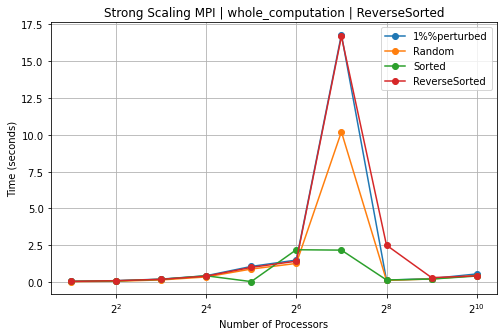

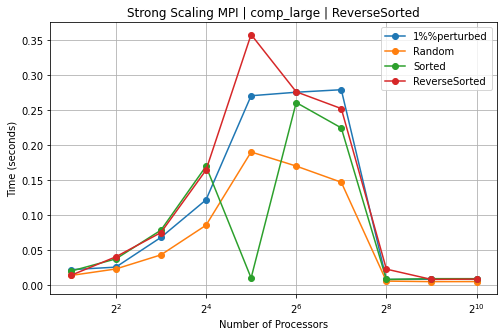

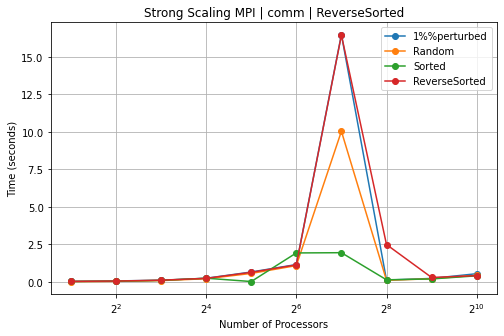

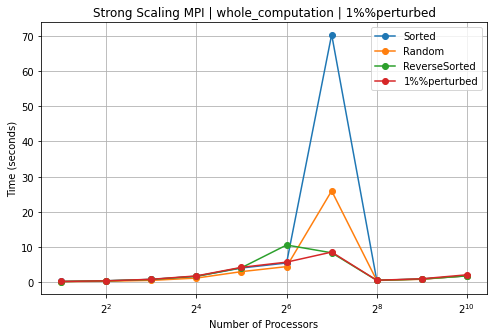

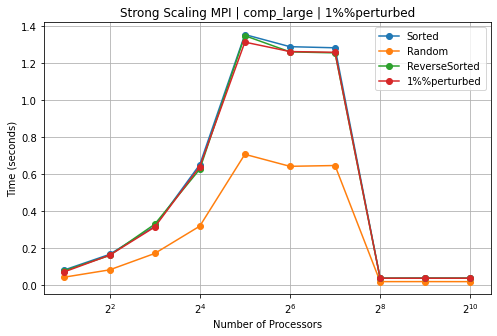

...

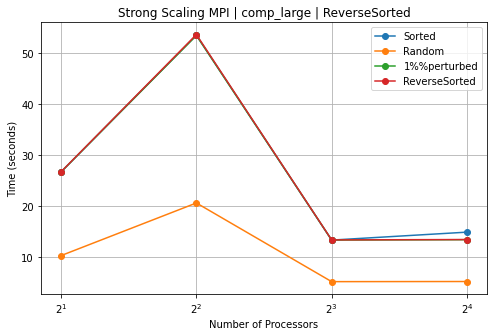

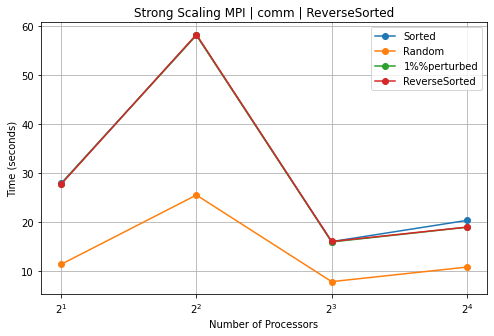

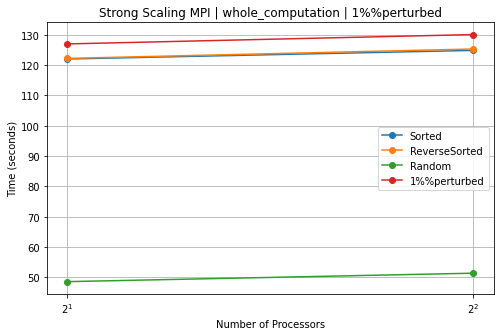

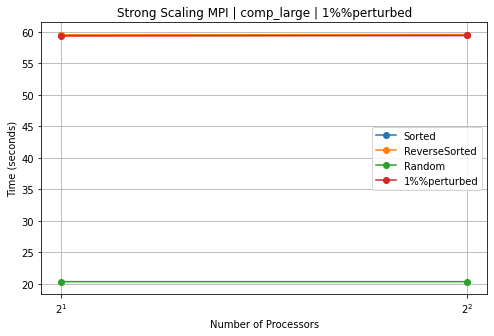

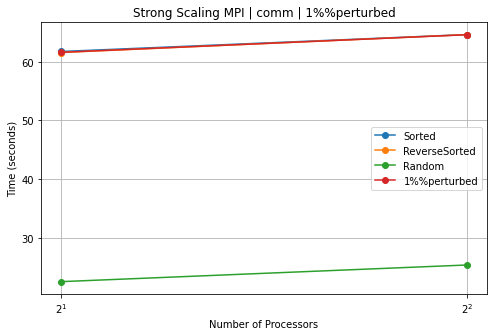

In [70]:
plot_strong(df)

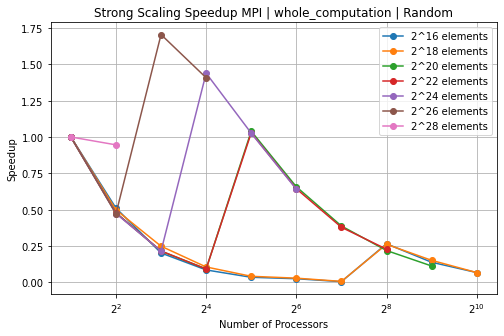

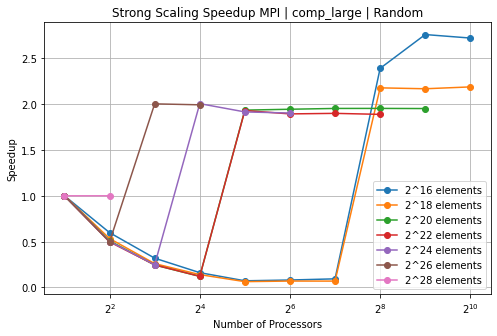

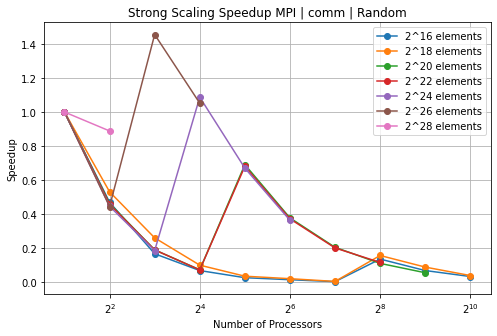

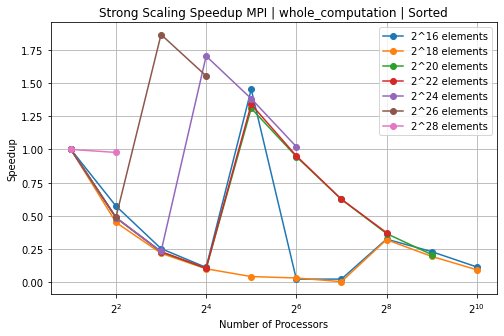

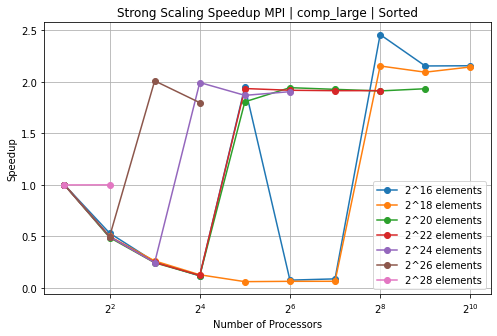

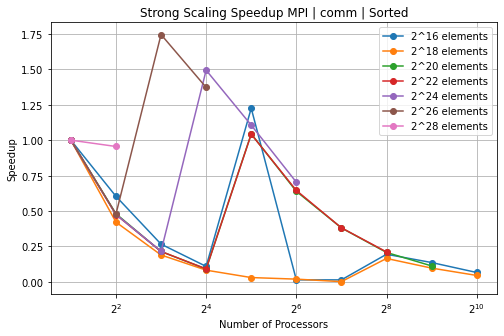

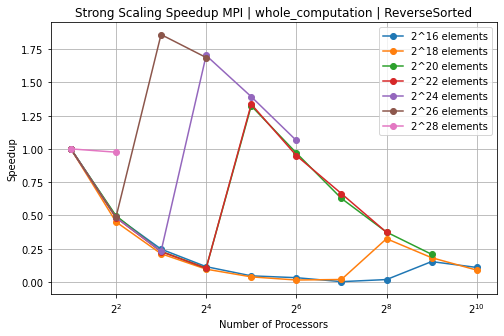

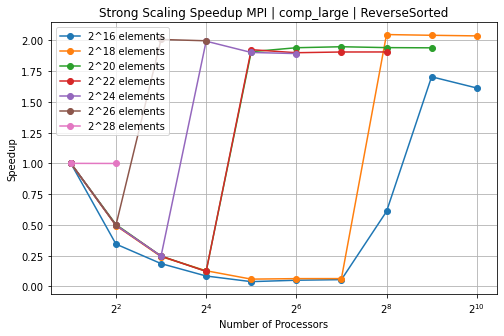

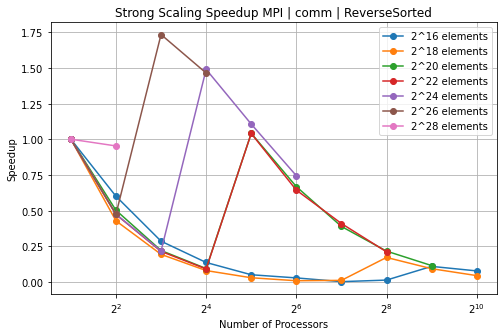

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


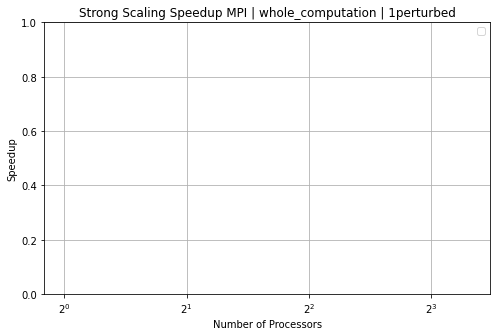

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


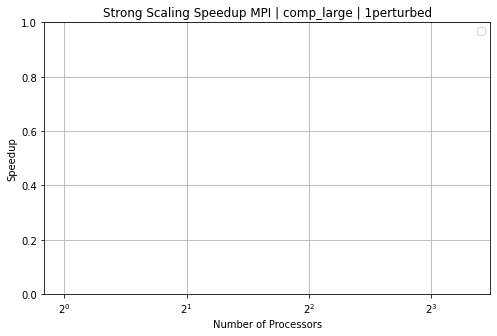

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


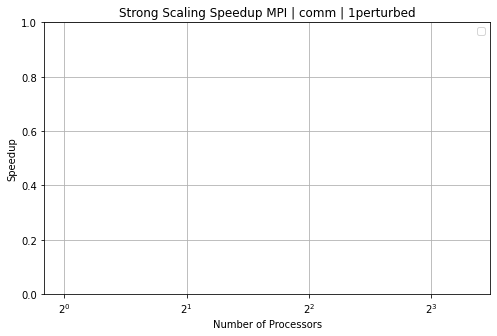

In [71]:
plot_speedup(df)